<a href="https://colab.research.google.com/github/oulbacha-ilyas/QALHATATech-ltd-Eye-Fixations-Prediction/blob/main/aftas_dashboard.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Part 2 of AFTAS Project: AFTAS Performance Dashboard.
We first create pipelines of data processing using the Python Library Pandas. Then we link the pipeline to the dashboard created using the Python Library "holoviews".

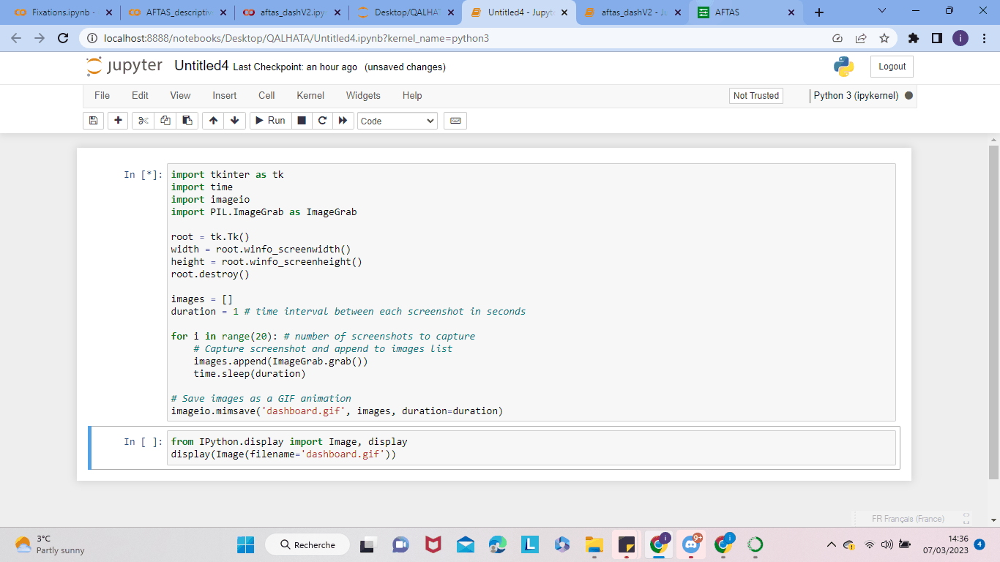

In [14]:
from IPython.display import Image
Image(filename='dashboard.gif')

In [1]:
from google.colab import files

uploadedfile1 = files.upload()


#upload this files
"""all_surfaces.csv
attempt_per_pilot.csv
fixdataEcam.csv
fixdataEfis.csv
fixdataPfd.csv """


Saving fixdataEcam.csv to fixdataEcam.csv
Saving fixdataEfis.csv to fixdataEfis.csv
Saving fixdataPfd.csv to fixdataPfd.csv


'all_surfaces.csv\nattempt_per_pilot.csv\nfixdataEcam.csv\nfixdataEfis.csv\nfixdataPfd.csv '

In [2]:
###next step : create a pipline and link it with the template to plot the desired plots instantly

#select the surface
#calculate the desired metric
#choose home to compare to
#plot the results
#select the surface

import pandas as pd

fixdataEcam=pd.read_csv("fixdataEcam.csv")
#fixdataEcam=fixdataEcam[fixdataEcam["fixation detected on surface"]==True]

fixdataPfd=pd.read_csv("fixdataPfd.csv")
#fixdataEcam=fixdataEcam[fixdataEcam["fixation detected on surface"]==True]

fixdataEfis=pd.read_csv("fixdataEfis.csv")
#fixdataEcam=fixdataEcam[fixdataEcam["fixation detected on surface"]==True]


ecam_pipe= (
    fixdataEcam[
        ((fixdataEcam == fixdataEcam))
    ]["duration [ms]"]
    .reset_index()  
    #.reset_index(drop=True)
    .drop(['index'], axis=1)
    #.set_index("Metric")
)
ecam_pipe.rename(columns={"duration [ms]":"ECAM"},inplace=True)

#pfd

pfd_pipe= (
    fixdataPfd[
        ((fixdataPfd == fixdataPfd))
    ]["duration [ms]"]
    .reset_index()  
    #.reset_index(drop=True)
    .drop(['index'], axis=1)
)
pfd_pipe.rename(columns={"duration [ms]":"PFD"},inplace=True)

#efis
efis_pipe= (
    fixdataEfis[
        ((fixdataEfis == fixdataEfis))
    ]["duration [ms]"]
    .reset_index()  
    #.reset_index(drop=True)
    .drop(['index'], axis=1)
)
efis_pipe.rename(columns={"duration [ms]":"EFIS"},inplace=True)

all_surfaces = pd.concat([ecam_pipe,pfd_pipe,efis_pipe], axis=1, ignore_index=False)
all_surfaces["index"]=all_surfaces.index
all_surfaces
#all_surfaces.index.rename("index",inplace=True)

,ECAM,PFD,EFIS,index
0,411.0,839,839,0
1,339.0,348,348,1
2,267.0,367,367,2
3,148.0,168,168,3
4,1364.0,128,128,4
...,...,...,...,...
398,NaN,2140,2140,398
399,NaN,92,92,399
400,NaN,100,100,400
401,NaN,236,236,401


In [3]:
#pipeline to calculate the metrics and stroe them in table
##attempt per pilot

##metrics per attempt
##attempt per surface all_surfaces
i=1;
attempt_per_pilot=pd.DataFrame(columns=["Attempt","avg_pfd","cumul_pfd","var_pfd","avg_ecam","cumul_ecam","var_ecam","avg_efis","cumul_efis","var_efis"])
attempt_per_pilot=attempt_per_pilot.append({"Attempt":i,"avg_pfd":all_surfaces["PFD"].mean(),"cumul_pfd":all_surfaces["PFD"].sum(),"var_pfd":all_surfaces["PFD"].std(),"avg_ecam":all_surfaces["ECAM"].mean(),"cumul_ecam":all_surfaces["ECAM"].sum(),"var_ecam":all_surfaces["ECAM"].std(),"avg_efis":all_surfaces["EFIS"].mean(),"cumul_efis":all_surfaces["EFIS"].sum(),"var_efis":all_surfaces["EFIS"].std()},ignore_index=True)

i=1
while i < 10 :
    attempt_per_pilot=attempt_per_pilot.append({"Attempt":i,"avg_pfd":(1.2)*attempt_per_pilot.iloc[i-1,1].mean(),"cumul_pfd":(1.2)*attempt_per_pilot.iloc[i-1,2].sum(),"var_pfd":(1.2)*attempt_per_pilot.iloc[i-1,3].std(),"avg_ecam":(1.2)*attempt_per_pilot.iloc[i-1,4].mean(),"cumul_ecam":(1.2)*attempt_per_pilot.iloc[i-1,5].sum(),"var_ecam":(1.2)*attempt_per_pilot.iloc[i-1,6].std(),"avg_efis":(1.2)*attempt_per_pilot.iloc[i-1,7].mean(),"cumul_efis":(1.2)*attempt_per_pilot.iloc[i-1,8].sum(),"var_efis":(1.2)*attempt_per_pilot.iloc[i-1,9].std()},ignore_index=True)
    i+=1

attempt_per_pilot 

,Attempt,avg_pfd,cumul_pfd,var_pfd,avg_ecam,cumul_ecam,var_ecam,avg_efis,cumul_efis,var_efis
0,1.0,616.583127,2.484830e+05,834.930152,775.983051,137349.000000,1083.362225,616.583127,2.484830e+05,834.930152
1,1.0,739.899752,2.981796e+05,0.000000,931.179661,164818.800000,0.000000,739.899752,2.981796e+05,0.000000
2,2.0,887.879702,3.578155e+05,0.000000,1117.415593,197782.560000,0.000000,887.879702,3.578155e+05,0.000000
3,3.0,1065.455643,4.293786e+05,0.000000,1340.898712,237339.072000,0.000000,1065.455643,4.293786e+05,0.000000
4,4.0,1278.546771,5.152543e+05,0.000000,1609.078454,284806.886400,0.000000,1278.546771,5.152543e+05,0.000000
5,5.0,1534.256125,6.183052e+05,0.000000,1930.894145,341768.263680,0.000000,1534.256125,6.183052e+05,0.000000
6,6.0,1841.107351,7.419663e+05,0.000000,2317.072974,410121.916416,0.000000,1841.107351,7.419663e+05,0.000000
7,7.0,2209.328821,8.903595e+05,0.000000,2780.487569,492146.299699,0.000000,2209.328821,8.903595e+05,0.000000
8,8.0,2651.194585,1.068431e+06,0.000000,3336.585083,590575.559639,0.000000,2651.194585,1.068431e+06,0.000000
9,9.0,3181.433502,1.282118e+06,0.000000,4003.902099,708690.671567,0.000000,3181.433502,1.282118e+06,0.000000


In [4]:
def environment():
    try:
        get_ipython()
        return "notebook"
    except:
        return "server"
environment()

'notebook'

In [5]:
!pip install hvplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 75.8 MB/s eta 0:00:00


In [6]:
import pathlib
import pandas as pd
import panel as pn
import xarray as xr
import holoviews as hv
#import hvplot.pandas # noqa

pn.extension('tabulator', template='material', sizing_mode='stretch_width')

import colorcet as cc

from matplotlib.figure import Figure
from matplotlib.backends.backend_agg import FigureCanvas

%matplotlib inline



In [7]:
import hvplot.pandas # noqa


In [8]:


#stats_efis = stats_efis.set_index('Pilot Number')
PALETTE = ["#ff6f69", "#ffcc5c", "#88d8b0"]
pn.Row(
    pn.layout.HSpacer(height=50, background=PALETTE[0]),
    pn.layout.HSpacer(height=50, background=PALETTE[1]),
    pn.layout.HSpacer(height=50, background=PALETTE[2]),
)

Row(sizing_mode='stretch_width')
    [0] HSpacer(background='#ff6f69', height=50)
    [1] HSpacer(background='#ffcc5c', height=50)
    [2] HSpacer(background='#88d8b0', height=50)

In [9]:
dashboards= pn.widgets.RadioButtonGroup(
    name='Dashboard',
    options=["Latest Simulation","Group Simulation","Slef Record","Group Record"], 
    value=["Latest Simulation","Group Simulation","Slef Record","Group Record"],
    button_type='success')
time = pn.widgets.FloatSlider(name='Time [s]', start=1649867023157537731, end=1649868532856733069, step=20968044379)
pilot = pn.widgets.ToggleGroup(
    name='Pilots',
    options=['Me','Yusuf', 'Adam', 'John', 'Bianca'], 
    value=['Me','Yusuf', 'Adam', 'John', 'Bianca'],
    button_type='success')
surface = pn.widgets.RadioButtonGroup(
    name='Surface',
    options=["ECAM","PFD","EFIS"], 
    value=["ECAM","PFD","EFIS"],
    button_type='success')
metrics = pn.widgets.RadioButtonGroup(
    name='Performance Metric', 
    #options=['Speed','Focus','Harmony'], create a separate table for each metric
    options=['Average Duration [s]','Cumulative Duration [s]', 'Variation'],
    value=['Average Duration [s]','Cumulative Duration [s]', 'Variation'],
    button_type='success'
)

attempt = pn.widgets.FloatSlider(name='Minimum magnitude', start=0, end=10, value=5)

attempts = pn.widgets.ToggleGroup(
    name='Attempts',
    options=["0","1","2","3","4"], 
    value=["Attemp 1","Attemp 2","Attemp 3","Attemp 4","Attemp 5"],
    button_type='success')

In [10]:
metrics

RadioButtonGroup(button_type='success', name='Performance Metric', options=['Average Duration [s]', ...], sizing_mode='stretch_width')

In [11]:
###next step : create a piple and link it with the template to plot the desired plots instantly

#select the surface
#calculate the desired metric
#choose home to compare to
#plot the results
fixdataEcam=pd.read_csv("fixdataEcam.csv")
fixdataEcam=fixdataEcam.drop(["Unnamed: 0"],axis=1)

fixdataPfd=pd.read_csv("fixdataPfd.csv")
fixdataPfd=fixdataPfd.drop(["Unnamed: 0"],axis=1)

fixdataEfis=pd.read_csv("fixdataEfis.csv")
fixdataEfis=fixdataEfis.drop(["Unnamed: 0"],axis=1)

attempt_per_pilot=pd.read_csv("attempt_per_pilot.csv")
attempt_per_pilot=attempt_per_pilot.drop(["Unnamed: 0"],axis=1)

#attempt_per_pilot

KeyError: ignored

In [ ]:
#select the surface

ecam_pipe= (
    fixdataEcam[
        ((fixdataEcam == fixdataEcam))
    ]["duration [ms]"]
    .reset_index()  
    #.reset_index(drop=True)
    .drop(['index'], axis=1)
    #.set_index("Metric")
)
ecam_pipe.rename(columns={"duration [ms]":"ECAM"},inplace=True)

#pfd

pfd_pipe= (
    fixdataPfd[
        ((fixdataPfd == fixdataPfd))
    ]["duration [ms]"]
    .reset_index()  
    #.reset_index(drop=True)
    .drop(['index'], axis=1)
)
pfd_pipe.rename(columns={"duration [ms]":"PFD"},inplace=True)

#efis
efis_pipe= (
    fixdataEfis[
        ((fixdataEfis == fixdataEfis))
    ]["duration [ms]"]
    .reset_index()  
    #.reset_index(drop=True)
    .drop(['index'], axis=1)
)
efis_pipe.rename(columns={"duration [ms]":"EFIS"},inplace=True)

all_surfaces = pd.concat([ecam_pipe,pfd_pipe,efis_pipe], axis=1, ignore_index=False)
all_surfaces["index"]=all_surfaces.index
all_surfaces
#all_surfaces.index.rename("index",inplace=True)

,ECAM,PFD,EFIS,index
0,411.0,839,839,0
1,339.0,348,348,1
2,267.0,367,367,2
3,148.0,168,168,3
4,1364.0,128,128,4
...,...,...,...,...
398,NaN,2140,2140,398
399,NaN,92,92,399
400,NaN,100,100,400
401,NaN,236,236,401


In [ ]:
surface

RadioButtonGroup(button_type='success', name='Surface', options=['ECAM', 'PFD', 'EFIS'], sizing_mode='stretch_width')

In [ ]:
#Self record:

return_df=attempt_per_pilot
def pipe_self_record(surface,metrics) :
    #add surface and metric condition
    if surface=="PFD":
        print("PFD")
        if metrics=="Average Duration [s]":
            met="avg_pfd"
        elif  metrics=="Cumulative Duration [s]":
            met="cumul_pfd"
        else :
            met="var_pfd"
        #surf_pipe_df=attempt_per_pilot[['Attempt', met1, met2, met3]] 
        
    elif surface=="ECAM" :
        print("ECAM")
        if metrics=="Average Duration [s]":
            met="avg_ecam"
        elif  metrics=="Cumulative Duration [s]":
            met="cumul_ecam"
        else :
            met="var_ecam"
        #surf_pipe_df=attempt_per_pilot[["Attempt",met1, met2, met3]] 
    else :
        print("EFIS")
        if metrics=="Average Duration [s]":
            met="avg_efis"
        elif  metrics=="Cumulative Duration [s]":
            met="cumul_efis"
        else :
            met="var_efis"
    return_df=attempt_per_pilot[["Attempt",met]]
    return return_df[['Attempt', met]]
#surf_pipe_df
#metrics_pipe(surface)
return_df

,Attempt,avg_pfd,cumul_pfd,var_pfd,avg_ecam,cumul_ecam,var_ecam,avg_efis,cumul_efis,var_efis
0,1.0,616.583127,2.484830e+05,834.930152,775.983051,137349.000000,1083.362225,616.583127,2.484830e+05,834.930152
1,1.0,739.899752,2.981796e+05,0.000000,931.179661,164818.800000,0.000000,739.899752,2.981796e+05,0.000000
2,2.0,887.879702,3.578155e+05,0.000000,1117.415593,197782.560000,0.000000,887.879702,3.578155e+05,0.000000
3,3.0,1065.455643,4.293786e+05,0.000000,1340.898712,237339.072000,0.000000,1065.455643,4.293786e+05,0.000000
4,4.0,1278.546771,5.152543e+05,0.000000,1609.078454,284806.886400,0.000000,1278.546771,5.152543e+05,0.000000
5,5.0,1534.256125,6.183052e+05,0.000000,1930.894145,341768.263680,0.000000,1534.256125,6.183052e+05,0.000000
6,6.0,1841.107351,7.419663e+05,0.000000,2317.072974,410121.916416,0.000000,1841.107351,7.419663e+05,0.000000
7,7.0,2209.328821,8.903595e+05,0.000000,2780.487569,492146.299699,0.000000,2209.328821,8.903595e+05,0.000000
8,8.0,2651.194585,1.068431e+06,0.000000,3336.585083,590575.559639,0.000000,2651.194585,1.068431e+06,0.000000
9,9.0,3181.433502,1.282118e+06,0.000000,4003.902099,708690.671567,0.000000,3181.433502,1.282118e+06,0.000000


In [ ]:
#return the plot instead of datfarame

#Self record:

return_df=attempt_per_pilot
def pipe_self_record(surface,metrics) :
    #add surface and metric condition
    if surface=="PFD":
        print("PFD")
        if metrics=="Average Duration [s]":
            met="avg_pfd"
        elif  metrics=="Cumulative Duration [s]":
            met="cumul_pfd"
        else :
            met="var_pfd"
        #surf_pipe_df=attempt_per_pilot[['Attempt', met1, met2, met3]] 
        
    elif surface=="ECAM" :
        print("ECAM")
        if metrics=="Average Duration [s]":
            met="avg_ecam"
        elif  metrics=="Cumulative Duration [s]":
            met="cumul_ecam"
        else :
            met="var_ecam"
        #surf_pipe_df=attempt_per_pilot[["Attempt",met1, met2, met3]] 
    else :
        print("EFIS")
        if metrics=="Average Duration [s]":
            met="avg_efis"
        elif  metrics=="Cumulative Duration [s]":
            met="cumul_efis"
        else :
            met="var_efis"
    return_df=attempt_per_pilot[["Attempt",met]]
    return return_df[['Attempt', met]]
#surf_pipe_df
#metrics_pipe(surface)
return_df

,Attempt,avg_pfd,cumul_pfd,var_pfd,avg_ecam,cumul_ecam,var_ecam,avg_efis,cumul_efis,var_efis
0,1.0,616.583127,2.484830e+05,834.930152,775.983051,137349.000000,1083.362225,616.583127,2.484830e+05,834.930152
1,1.0,739.899752,2.981796e+05,0.000000,931.179661,164818.800000,0.000000,739.899752,2.981796e+05,0.000000
2,2.0,887.879702,3.578155e+05,0.000000,1117.415593,197782.560000,0.000000,887.879702,3.578155e+05,0.000000
3,3.0,1065.455643,4.293786e+05,0.000000,1340.898712,237339.072000,0.000000,1065.455643,4.293786e+05,0.000000
4,4.0,1278.546771,5.152543e+05,0.000000,1609.078454,284806.886400,0.000000,1278.546771,5.152543e+05,0.000000
5,5.0,1534.256125,6.183052e+05,0.000000,1930.894145,341768.263680,0.000000,1534.256125,6.183052e+05,0.000000
6,6.0,1841.107351,7.419663e+05,0.000000,2317.072974,410121.916416,0.000000,1841.107351,7.419663e+05,0.000000
7,7.0,2209.328821,8.903595e+05,0.000000,2780.487569,492146.299699,0.000000,2209.328821,8.903595e+05,0.000000
8,8.0,2651.194585,1.068431e+06,0.000000,3336.585083,590575.559639,0.000000,2651.194585,1.068431e+06,0.000000
9,9.0,3181.433502,1.282118e+06,0.000000,4003.902099,708690.671567,0.000000,3181.433502,1.282118e+06,0.000000


In [ ]:
inputi = hvplot.bind(pipe_self_record,surface,metrics).interactive()
inputi=inputi[inputi['Attempt'] < attempt]
ihvplot_self_rec = inputi.hvplot(x="Attempt", color=PALETTE, line_width=10, height=200,width=100)
ihvplot_self_rec

EFIS


EFIS


In [ ]:
#self latest:
return_df=all_surfaces
def pipe_self_lat(surface) :
    surf="PFD"
    #add surface and metric condition
    if surface=="PFD":
      surf="PFD"
    elif  surface=="ECAM":
      surf="ECAM"
    elif surface=="EFIS":
      surf="EFIS" 
    return_df=all_surfaces[surf]
    return return_df
#surf_pipe_df
#metrics_pipe(surface)
return_df

,ECAM,PFD,EFIS,index
0,411.0,839,839,0
1,339.0,348,348,1
2,267.0,367,367,2
3,148.0,168,168,3
4,1364.0,128,128,4
...,...,...,...,...
398,NaN,2140,2140,398
399,NaN,92,92,399
400,NaN,100,100,400
401,NaN,236,236,401


In [ ]:
inputi_self_lat = hvplot.bind(pipe_self_lat,surface).interactive()
ihvplot_self_lat = inputi_self_lat.hvplot(x="index", color=PALETTE, line_width=10, height=200,width=100)
ihvplot_self_lat

In [ ]:
#return plot instead of df
return_df=all_surfaces
def pipe_self_lat_returnHVP(surface) :
    surf="PFD"
    #add surface and metric condition
    if surface=="PFD":
      surf="PFD"
    elif  surface=="ECAM":
      surf="ECAM"
    elif surface=="EFIS":
      surf="EFIS" 
    #return_df=all_surfaces[surf]
    inpt=all_surfaces.interactive()
    inpt=inpt[surf]
    ihplot=inpt.hvplot()
    return ihplot
#surf_pipe_df
#metrics_pipe(surface)
#ihplot

In [ ]:


pipe_self_lat_returnHVP(surface)

In [ ]:
@pn.depends(dashboards)
def dash_choiceHVP(dashboards,surface):
  return_HVP=pipe_self_lat_returnHVP(surface)
  if dashboards=="Self Record":
    return_HVP=pipe_self_lat_returnHVP(surface)
  return return_HVP


In [ ]:

text = "Dataset:Fixations,Gaze,Blinks"
# Header box
header_boxHVP = pn.WidgetBox(pn.layout.Spacer(margin=100), text, width=300, height=500, align="center")
# Plot Box
plots_boxHVP = pn.WidgetBox(pn.Column(pn.Row(dash_choiceHVP(dashboards,surface)), align="start", width=600,sizing_mode="stretch_width"))

# Dashboard based on the selected dashboard type :"Current Simulation","Group Simulation","Slef Record","Group Record"
dashboardHVP = pn.Row(plots_boxHVP, sizing_mode="stretch_width")
dashboardHVP

Row(sizing_mode='stretch_width')
    [0] WidgetBox(sizing_mode='stretch_width')
        [0] Column(sizing_mode='stretch_width', width=600)
            [0] Row(sizing_mode='stretch_width')
                [0] Interactive(Interactive, sizing_mode='stretch_width')

In [ ]:
templateHVP = pn.template.FastListTemplate(
    title='QALHATA Technologies- AFTAS Project', 
    sidebar=['Dashboard',dashboards,'Surface',surface,'Performance Metrics',metrics,'Attempt',attempt],
    main=[dashboardHVP],
    accent_base_color="#88d8b0",
    header_background="#17174a",
)
templateHVP.show()
templateHVP.servable();

Launching server at http://localhost:40503


In [ ]:
#The function to jump from one dataframe to another based on the selected dashboard,surface,metrics and attempts==>Different dashboards requires different data sources
return_dfs=pipe_self_record(surface,metrics)
def dash_choice(dashboards,surface,metrics):
  s=surface
  m=metrics
  return_dfs=pipe_self_record(surface,metrics)
  d=dashboards
  if d=="Self Record":
    return_dfs=pipe_self_record(s,m)
    return return_dfs
  elif d=="Latest Simulation":
    return_dfs=pipe_self_lat(s)
    return return_dfs
  #==>add more conditions here for different types of dashboard
  return return_dfs
return_dfs

EFIS


,Attempt,var_efis
0,1.0,834.930152
1,1.0,0.000000
2,2.0,0.000000
3,3.0,0.000000
4,4.0,0.000000
5,5.0,0.000000
6,6.0,0.000000
7,7.0,0.000000
8,8.0,0.000000
9,9.0,0.000000


In [ ]:
inputi_chosen_dash = hvplot.bind(dash_choice,dashboards,surface,metrics).interactive()
#inputi_chosen_dash=inputi_chosen_dash[inputi_chosen_dash['Attempt'] < attempt]
inputi_chosen_dash



EFIS


EFIS


In [ ]:
ihvplot_chosen_dash = inputi_chosen_dash.hvplot(color=PALETTE, line_width=10, height=200,width=100)
ihvplot_chosen_dash

In [ ]:

text = "Dataset:Fixations,Gaze,Blinks"
# Header box
header_box = pn.WidgetBox(pn.layout.Spacer(margin=100), text, width=300, height=500, align="center")
# Plot Box
plots_box = pn.WidgetBox(pn.Column(pn.Row(ihvplot_chosen_dash.panel()), align="start", width=600,sizing_mode="stretch_width"))

# Dashboard based on the selected dashboard type :"Current Simulation","Group Simulation","Slef Record","Group Record"
dashboard = pn.Row(plots_box, sizing_mode="stretch_width")
dashboard

Row(sizing_mode='stretch_width')
    [0] WidgetBox(sizing_mode='stretch_width')
        [0] Column(sizing_mode='stretch_width', width=600)
            [0] Row(sizing_mode='stretch_width')
                [0] ParamFunction(function, sizing_mode='stretch_width')

In [ ]:
template = pn.template.FastListTemplate(
    title='QALHATA Technologies- AFTAS Project', 
    sidebar=['Dashboard',dashboards,'Surface',surface,'Performance Metrics',metrics,'Attempt',attempt],
    main=[dashboard],
    accent_base_color="#88d8b0",
    header_background="#17174a",
)
template.show()
template.servable();

Launching server at http://localhost:34579


In [ ]:
text = "Dataset:Fixations,Gaze,Blinks"
# Header box
header_box1 = pn.WidgetBox(pn.layout.Spacer(margin=100), text, width=300, height=500, align="center")
# Plot Box
plots_box1 = pn.WidgetBox(pn.Column(pn.Row(ihvplot_self_lat.panel()), align="start", width=600,sizing_mode="stretch_width"))

# Dashboard based on the selected dashboard type :"Current Simulation","Group Simulation","Slef Record","Group Record"
dashboard1 = pn.Row(plots_box1, sizing_mode="stretch_width")


In [ ]:
text = "Dataset:Fixations,Gaze,Blinks"
# Header box
header_box2 = pn.WidgetBox(pn.layout.Spacer(margin=100), text, width=300, height=500, align="center")
# Plot Box
plots_box2 = pn.WidgetBox(pn.Column(pn.Row(ihvplot_self_rec.panel()), align="start", width=600,sizing_mode="stretch_width"))

# Dashboard based on the selected dashboard type :"Current Simulation","Group Simulation","Slef Record","Group Record"
dashboard2 = pn.Row(plots_box2, sizing_mode="stretch_width")


In [ ]:
# creating demo data
all_surfaces_group = all_surfaces.rename(columns={'ECAM': 'ecam_instructor', 'PFD': 'pfd_instructor','EFIS': 'efis_instructor'})
all_surfaces_group["ecam_pilot1"]=all_surfaces_group["ecam_instructor"]*(1-0.1)
all_surfaces_group["pfd_pilot1"]=all_surfaces_group["pfd_instructor"]*(1-0.1)
all_surfaces_group["efis_pilot1"]=all_surfaces_group["efis_instructor"]*(1-0.1)
all_surfaces_group["ecam_pilot2"]=all_surfaces_group["ecam_instructor"]*(1-0.3)
all_surfaces_group["pfd_pilot2"]=all_surfaces_group["pfd_instructor"]*(1-0.3)
all_surfaces_group["efis_pilot2"]=all_surfaces_group["efis_instructor"]*(1-0.3)
all_surfaces_group.head()

,ecam_instructor,pfd_instructor,efis_instructor,index,ecam_pilot1,pfd_pilot1,efis_pilot1,ecam_pilot2,pfd_pilot2,efis_pilot2
0,411.0,839,839,0,369.9,755.1,755.1,287.7,587.3,587.3
1,339.0,348,348,1,305.1,313.2,313.2,237.3,243.6,243.6
2,267.0,367,367,2,240.3,330.3,330.3,186.9,256.9,256.9
3,148.0,168,168,3,133.2,151.2,151.2,103.6,117.6,117.6
4,1364.0,128,128,4,1227.6,115.2,115.2,954.8,89.6,89.6


In [ ]:
# creating pipe : selecting the surface data of all the pilots in the same session.Another pipe could be used to select the pilots
df_group_sim=all_surfaces_group
def pipe_group_lat(surface) :
  surf="pfd_instructor"
  if surface=="PFD":
     surf="pfd_instructor"
  elif  surface=="ECAM":
     surf="ecam_instructor"
  elif surface=="EFIS":
     surf="efis_instructor"
  df_group_sim=all_surfaces_group[surf]
  return df_group_sim
#surf_pipe_df
#metrics_pipe(surface)
df_group_sim

,ecam_instructor,pfd_instructor,efis_instructor,index,ecam_pilot1,pfd_pilot1,efis_pilot1,ecam_pilot2,pfd_pilot2,efis_pilot2
0,411.0,839,839,0,369.9,755.1,755.1,287.7,587.3,587.3
1,339.0,348,348,1,305.1,313.2,313.2,237.3,243.6,243.6
2,267.0,367,367,2,240.3,330.3,330.3,186.9,256.9,256.9
3,148.0,168,168,3,133.2,151.2,151.2,103.6,117.6,117.6
4,1364.0,128,128,4,1227.6,115.2,115.2,954.8,89.6,89.6
...,...,...,...,...,...,...,...,...,...,...
398,NaN,2140,2140,398,NaN,1926.0,1926.0,NaN,1498.0,1498.0
399,NaN,92,92,399,NaN,82.8,82.8,NaN,64.4,64.4
400,NaN,100,100,400,NaN,90.0,90.0,NaN,70.0,70.0
401,NaN,236,236,401,NaN,212.4,212.4,NaN,165.2,165.2


In [ ]:
inputi_group_lat = hvplot.bind(pipe_group_lat,surface).interactive()
inputi_group_lat

In [ ]:
ihvplot_group_lat = inputi_group_lat.hvplot(x="index", color=PALETTE, line_width=10, height=200,width=100)
ihvplot_group_lat

In [ ]:
text = "Group Simulation"
# Header box
header_box3 = pn.WidgetBox(pn.layout.Spacer(margin=100), text, width=300, height=500, align="center")
# Plot Box
plots_box3 = pn.WidgetBox(pn.Column(pn.Row(ihvplot_group_lat.panel()), align="start", width=600,sizing_mode="stretch_width"))

# Dashboard based on the selected dashboard type :"Current Simulation","Group Simulation","Slef Record","Group Record"
dashboard3 = pn.Row(plots_box3, sizing_mode="stretch_width")


In [ ]:
vanilla = pn.template.FastListTemplate(title='AFTAS')


page = pn.Column(sizing_mode='stretch_width')

content1 = [
    pn.Row(surface),
    dashboard1,
]
content2 = [
    pn.Row(surface,metrics,attempt),
    dashboard2,
]
content3 = [
    pn.Row(surface),
    dashboard3,
]

link1 = pn.widgets.Button(name='Latest Simulation')
link2 = pn.widgets.Button(name='Self Record')
link3 = pn.widgets.Button(name='Group Simulation')


vanilla.sidebar.append(link1)
vanilla.sidebar.append(link2)
vanilla.sidebar.append(link3)
vanilla.main.append(page)

def load_content1(event):
    vanilla.main[0].objects = content1
def load_content2(event):
    vanilla.main[0].objects = content2
def load_content3(event):
    vanilla.main[0].objects = content3

    
link1.on_click(load_content1)
link2.on_click(load_content2)
link3.on_click(load_content3)

vanilla.show()

Launching server at http://localhost:35587


In [ ]:
import panel as pn
pn.extension("echarts")

In [ ]:
speed = pn.widgets.FloatSlider(name='speed',value=1500 ,start=0, end=3000, step=100)
speed

FloatSlider(end=3000, name='speed', sizing_mode='stretch_width', step=100, value=1500)

In [ ]:
## fixations gauge meter
#number of moves of eyes per s : total moves/total time in the surface
gg0=pn.indicators.Gauge(
    name='Fixations Speed',value=300, bounds=(0, 3000), format='{value} px/ms',
    colors=[(0.2, 'green'), (0.8, 'gold'), (1, 'red')])
#the euclidian distance of fixations from the central point of a surface or from the perimeter that allows capturing info
gg1=pn.indicators.Gauge(
    name='Fixations Focus',value=50, bounds=(0,100), format='{value}',
    colors=[(0.2, 'green'), (0.8, 'gold'), (1, 'red')])

##gaze gauge meter :
#number of moves of gaze per s : total moves/total time in the surface
gg2=pn.indicators.Gauge(
    name='Gaze Speed',value=50, bounds=(0,100), format='{value} moves/s',
    colors=[(0.2, 'green'), (0.8, 'gold'), (1, 'red')])
#How far is the gaze from the required fixations,how bent it is
gg3=pn.indicators.Gauge(
    name='Gaze Focus',value=50, bounds=(0,100), format='{value} moves/s',
    colors=[(0.2, 'green'), (0.8, 'gold'), (1, 'red')])

pn.Column(pn.Row(gg0,gg1))


Column(sizing_mode='stretch_width')
    [0] Row(sizing_mode='stretch_width')
        [0] Gauge(bounds=(0, 3000), colors=[(0.2, 'green'), ...], format='{value} px/ms', name='Fixations Speed', value=300)
        [1] Gauge(colors=[(0.2, 'green'), ...], format='{value}', name='Fixations Focus', value=50)

In [ ]:
pn.extension("echarts")
pn.extension('plotly')

In [ ]:
import plotly.graph_objects as go
import matplotlib

@pn.depends(dashboards)
def stream_data(dashboards):
    speed=0
    if dashboards=="Latest Simulation":
        speed=200
    elif dashboards=="Group Simulation":
        speed=300
    elif dashboards=="Slef Record":
        speed=400
    fig=go.Figure()
    
    fig.reset(True)
    fig = go.Figure(go.Indicator(
    domain = {'x': [0, 1], 'y': [0, 1]},
    value = speed,
    mode = "gauge+number+delta",
    title = {'text': "Speed"},
    delta = {'reference': 380},
    gauge = {'axis': {'range': [None, 500]},
             'steps' : [
                 {'range': [0, 250], 'color': "lightgray"},
                 {'range': [250, 400], 'color': "gray"}],
             'threshold' : {'line': {'color': "red", 'width': 4}, 'thickness': 0.75, 'value': 490}}))

    fig.show()
    
    #return fig'green'), (0.8, 'gold'), (1, 'red')])

    

In [ ]:
dashboards

RadioButtonGroup(button_type='success', name='Dashboard', options=['Latest Simulation', ...], sizing_mode='stretch_width')

In [ ]:
inputi_gauge = hvplot.bind(stream_data,dashboards).interactive()
inputi_gauge

AttributeError: ignored

In [ ]:
text = "gauge"
# Header box
header_box5 = pn.WidgetBox(pn.layout.Spacer(margin=100), text, width=300, height=500, align="center")
# Plot Box
plots_box5 = pn.WidgetBox(pn.Column(pn.Row(stream_data(dashboards)), align="start", width=600,sizing_mode="stretch_width"))

# Dashboard based on the selected dashboard type :"Current Simulation","Group Simulation","Slef Record","Group Record"
dashboard5 = pn.Row(plots_box5, sizing_mode="stretch_width")
dashboard5

AttributeError: ignored

In [ ]:
gg0=pn.indicators.Gauge(
    name='Fixations Speed',value=300, bounds=(0, 3000), format='{value} px/ms',
    colors=[(0.2, 'green'), (0.8, 'gold'), (1, 'red')])
p1=pn.Column(gg0)
p2=pn.Column(gg1)

@pn.depends(surface)
def sizing(surface):
  pc=pn.Row()
  if surface=="ECAM":
    pc=pn.Row(p1)
  elif surface=="PFD":
    pc=pn.Row(p2)
  return pc
text = "gauge"
# Header box
header_boxg = pn.WidgetBox(pn.layout.Spacer(margin=100), text, width=300, height=500, align="center")
# Plot Box
plots_boxg = pn.WidgetBox(sizing(surface), align="start", width=600,sizing_mode="stretch_width")
# Dashboard based on the selected dashboard type :"Current Simulation","Group Simulation","Slef Record","Group Record"
dashboardg = pn.Row(plots_boxg, sizing_mode="stretch_width")
dashboardg


Row(sizing_mode='stretch_width')
    [0] WidgetBox(sizing_mode='stretch_width', width=600)
        [0] Row(sizing_mode='stretch_width')

In [ ]:
vanilla = pn.template.FastListTemplate(title='AFTAS')


page = pn.Column(sizing_mode='stretch_width')

content1 = [
    pn.Row(surface),
    dashboard1,
]
content2 = [
    pn.Row(surface,metrics,attempt),
    dashboard2,
]
content3 = [
    pn.Row(surface),
    dashboard3,
]
content4 = [
    pn.Row(surface,metrics,attempt),
    dashboardg,
]
content5 = [
    pn.Row(dashboards),
    dashboardg,
]

link1 = pn.widgets.Button(name='Latest Simulation')
link2 = pn.widgets.Button(name='Self Record')
link3 = pn.widgets.Button(name='Group Simulation')
link4= pn.widgets.Button(name='Group Record')
link5= pn.widgets.Button(name='Gauge')

vanilla.sidebar.append(link1)
vanilla.sidebar.append(link2)
vanilla.sidebar.append(link3)
vanilla.sidebar.append(link4)
vanilla.sidebar.append(link5)
vanilla.main.append(page)

def load_content1(event):
    vanilla.main[0].objects = content1
def load_content2(event):
    vanilla.main[0].objects = content2
def load_content3(event):
    vanilla.main[0].objects = content3
def load_content4(event):
    vanilla.main[0].objects = content4
def load_content5(event):
    vanilla.main[0].objects = content5
    
link1.on_click(load_content1)
link2.on_click(load_content2)
link3.on_click(load_content3)
link4.on_click(load_content4)
link5.on_click(load_content5)

vanilla.show()

Launching server at http://localhost:43741
